<a href="https://colab.research.google.com/github/gf4417/dl-cw2/blob/main/dl_cw2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Coursework 2: Generative Models

## Instructions

Please submit on CATe two zip files:

*CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells below.**
2. Your trained VAE model as *VAE_model.pth*

*GAN.zip* containing your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*

Please avoid using markdown headings (# ## etc.) as these will affect the ToC. Instead use html headings if you want emphasis.

Similarly to the previous coursework, we recommend that you use Google Colaboratory in order to train the required networks.

TAs will run a testing cell (at the end of this notebook), so you are required to copy your transform and denorm functions to a cell near the bottom of the document (it is demarkated).

<font color="blue">**The deadline for submission is 19:00, Thursday 19th February, 2021** </font>

## Setting up working environment

For this coursework you, will need to train a large network, therefore we recommend you work with Google Colaboratory, which provides free GPU time. You will need a Google account to do so.

Please log in to your account and go to the following page: https://colab.research.google.com. Then upload this notebook.

For GPU support, go to "Edit" -> "Notebook Settings", and select "Hardware accelerator" as "GPU".

You will need to install pytorch and import some utilities by running the following cell:

In [1]:
!pip install -q torch torchvision
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
%load_ext google.colab.data_table

In [2]:
from google.colab import drive
drive.mount('/content/drive') # Outputs will be saved in your google drive

Mounted at /content/drive


## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. Experiment with Feedforward and Convolutional Layers to see which gives better results.

b. Design an appropriate loss function and train the model.


In [3]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
###Hyper-parameter selection


In [4]:
# Necessary Hyperparameters 
num_epochs = 15 #20 #40 
learning_rate = 0.005 
batch_size = 32
latent_dim = 10 #26 # Choose a value for the size of the latent space

# Additional Hyperparameters 
beta = 4
model_name = "VAE_epochs" + str(num_epochs) + "_lr" + str(learning_rate) + "_bs" + str(batch_size) + "_ld" + str(latent_dim) + "_b" + str(beta)

# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
    #transforms.Normalize(mean=0.5, std=0.5)
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x #(x * 0.5) + 0.5

### Data loading


In [5]:
train_dat = datasets.MNIST(
    "data/", train=True, download=True, transform=transform
)
test_dat = datasets.MNIST("data/", train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/image_original.png')

Extracting data/MNIST/raw/train-images-idx3-ubyte.gz to data/MNIST/raw


Extracting data/MNIST/raw/train-labels-idx1-ubyte.gz to data/MNIST/raw


Extracting data/MNIST/raw/t10k-images-idx3-ubyte.gz to data/MNIST/raw


Extracting data/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/MNIST/raw
Processing...






/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


Done!


### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [6]:
# *CODE FOR PART 1.1a IN THIS CELL*

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.latent_dim = latent_dim

        # Define Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1), 
            nn.BatchNorm2d(32), 
            nn.LeakyReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1), 
            nn.BatchNorm2d(64), 
            nn.LeakyReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1), 
            nn.BatchNorm2d(128), 
            nn.LeakyReLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1), 
            nn.BatchNorm2d(256), 
            nn.LeakyReLU(),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1), 
            nn.BatchNorm2d(512), 
            nn.LeakyReLU(),
        )

        self.fc_mu = nn.Linear(512 * 1 * 1, self.latent_dim)
        self.fc_var = nn.Linear(512 * 1 * 1, self.latent_dim)

        # Define the Decoder
        self.decoder_in = nn.Linear(latent_dim, 512 * 1 * 1)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=3, 
                               stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(256), 
            nn.LeakyReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=3, 
                               stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128), 
            nn.LeakyReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=3, 
                               stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64), 
            nn.LeakyReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=3, 
                               stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32), 
            nn.LeakyReLU(),
            nn.ConvTranspose2d(32, 1, kernel_size=3, 
                               stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(1), 
            nn.LeakyReLU(),
            nn.Conv2d(1, 1, kernel_size=5, 
                                          stride=1, padding=0),
            #nn.LeakyReLU(), 
            nn.Sigmoid()
        )

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        result = self.encoder(x)
        result = result.view(x.size(0), -1)

        mu = self.fc_mu(result)
        logvar = self.fc_var(result)

        return mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        # TODO: check that the dimensions match up
        return std * eps + mu
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        result = self.decoder_in(z)
        #print(result.shape)
        result = result.view(-1, 512, 1, 1)
        #print(result.shape)
        result = self.decoder(result)
        # TODO add final layer?
        return result
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        mu, logvar = self.encode(x)
        #print(x.shape)
        z = self.reparametrize(mu, logvar)
        #print(z.shape)
        result = self.decode(z)
        #print(result.shape)

        return result, x, mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 3154353
VAE(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01)
    (9): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.01)
    (12): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (13): BatchNorm2d(512, eps=

--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [7]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        reconstruction_loss = F.mse_loss(recon_x, x, reduction="sum")
        KL_loss = torch.mean(-0.5 * torch.sum(1 + logvar - mu ** 2 - torch.exp(logvar), dim = 1), dim = 0)
        return (reconstruction_loss + beta * KL_loss), reconstruction_loss, KL_loss
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 



## Added for data collection ##
def evaluate_model(model, data_loader):
  model.eval()
  #model.to("cpu")
  all_loss, all_r_loss, all_kl_loss = [], [], []
  for t, (local_batch, _) in enumerate(data_loader):
    local_batch = local_batch.to(device)
    result, x, mu, logvar = model.forward(local_batch)
    # Calculate the loss of the predictions
    loss, r_loss, kl_loss = loss_function_VAE(result, x, mu, logvar, beta)
    # Append calculated losses
    all_loss.append(loss / batch_size)
    all_r_loss.append(r_loss / batch_size)
    all_kl_loss.append(kl_loss / batch_size)
    if t >= 5:
      break

  eval_loss = sum(all_loss) / t
  eval_r_loss = sum(all_r_loss) / t
  eval_kl_loss = sum(all_kl_loss) / t
  # Make sure the model is back to training
  #model.to(device)
  model.train()

  return eval_loss, eval_r_loss, eval_kl_loss

epochs_list = range(num_epochs)
train_eval_loss = np.zeros(num_epochs)
train_eval_r_loss = np.zeros(num_epochs)
train_eval_kl_loss = np.zeros(num_epochs)
test_eval_loss = np.zeros(num_epochs)
test_eval_r_loss = np.zeros(num_epochs)
test_eval_kl_loss = np.zeros(num_epochs)
###############################
#beta = 10 # 1 / params
beta_increment = 0 # (100 - beta) / num_epochs
model.train()
for epoch in range(num_epochs):     
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        print("epoch: ", epoch, "[Beta:", beta, "]")
        for t, (local_batch, _) in enumerate(loader_train):
          local_batch = local_batch.to(device)
          data = local_batch
          # Make predictions using the model
          result, x, mu, logvar = model.forward(local_batch)
          # Calculate the loss of the predictions
          loss, r_loss, kl_loss = loss_function_VAE(result, x, mu, logvar, beta)
          # Reset the gradients
          optimizer.zero_grad()
          # Using the optimizer make a step to update params
          loss.backward()
          optimizer.step()
          # Reset the gradients
          optimizer.zero_grad()
          if t % 100 == 0:
            print(" iteration: ", t, " [r_loss: " + str(r_loss) + "]"," [kl_loss: "+ str(kl_loss) +"]" )
        
        print("Evaluating train loss [epoch: " + str(epoch) + "]")
        train_eval_loss[epoch], train_eval_r_loss[epoch], train_eval_kl_loss[epoch] = evaluate_model(model, loader_train)
        print("Evaluated train loss: ", train_eval_loss[epoch], train_eval_r_loss[epoch], train_eval_kl_loss[epoch])
        print("Evaluating test loss [epoch: " + str(epoch) + "]")
        test_eval_loss[epoch], test_eval_r_loss[epoch], test_eval_kl_loss[epoch] = evaluate_model(model, loader_test)
        print("Evaluated test loss: ", test_eval_loss[epoch], test_eval_r_loss[epoch], test_eval_kl_loss[epoch])

        beta += beta_increment
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        # save the model
        if epoch == num_epochs - 1:
            with torch.no_grad():
                torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                    '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/'+ model_name + '.pth')


epoch:  0 [Beta: 4 ]
 iteration:  0  [r_loss: tensor(5693.1001, device='cuda:0', grad_fn=<MseLossBackward>)]  [kl_loss: tensor(1.1143, device='cuda:0', grad_fn=<MeanBackward1>)]
 iteration:  100  [r_loss: tensor(1231.0383, device='cuda:0', grad_fn=<MseLossBackward>)]  [kl_loss: tensor(13.7325, device='cuda:0', grad_fn=<MeanBackward1>)]
 iteration:  200  [r_loss: tensor(1121.5321, device='cuda:0', grad_fn=<MseLossBackward>)]  [kl_loss: tensor(16.9986, device='cuda:0', grad_fn=<MeanBackward1>)]
 iteration:  300  [r_loss: tensor(843.6364, device='cuda:0', grad_fn=<MseLossBackward>)]  [kl_loss: tensor(17.3012, device='cuda:0', grad_fn=<MeanBackward1>)]
 iteration:  400  [r_loss: tensor(938.0436, device='cuda:0', grad_fn=<MseLossBackward>)]  [kl_loss: tensor(17.2874, device='cuda:0', grad_fn=<MeanBackward1>)]
 iteration:  500  [r_loss: tensor(805.7993, device='cuda:0', grad_fn=<MseLossBackward>)]  [kl_loss: tensor(17.1790, device='cuda:0', grad_fn=<MeanBackward1>)]
 iteration:  600  [r_loss

### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


In [8]:
# Any code for your explanation here


**YOUR ANSWER**
The loss function used has three key parts, the reconstrution loss the kl loss and chosen beta value.
- **The VAE Prior**: I assumed that the prior distribution was Gaussian (multivariate) due to the Gaussians ability to be mapped to almost any distribution in the decoder stage and due to the fact that Gaussians may easily be reparameterised in the encoder stage. The KL loss was included in the loss to ensure the distribution of the encoder output was as close to the gaussion prior chosen. The KL loss was therefore calclulated in the loss using the gaussian based analytical solution using the means and variances produced by the encoder. 
- **Output domain**: Reviewing the input images (and so the desired output domain) it is clear that the range of values needed to be mapped to, exist between the values of 0 and 1. Therefore since the output domain was continous within this range it made sense to use the MSE as the reconstruction loss; in part due to its unbiased nature penalising erros in both directions equally.
- **Disentanglement in latent space**: To vary the level of disentanglement in latent space a suitable value of beta was chosen to put the required emphasis on the kl term of my designed loss in doing so emphasising independence matching between dimensions implied by the prior gaussian distribution.

<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

In [9]:
import matplotlib.image as mpimg

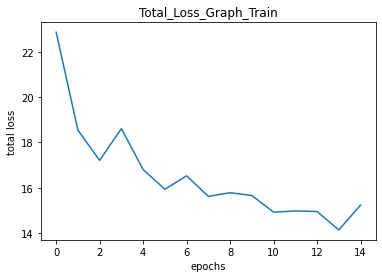

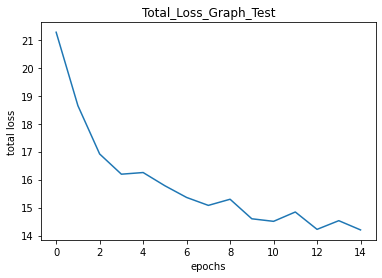

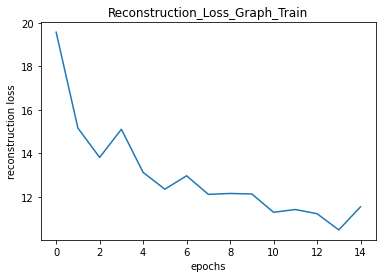

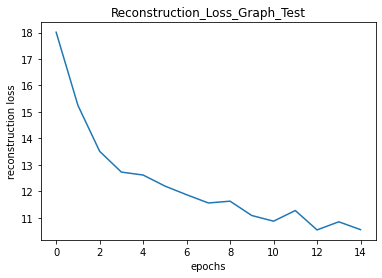

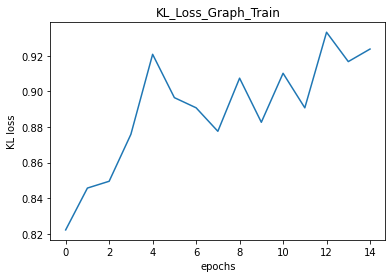

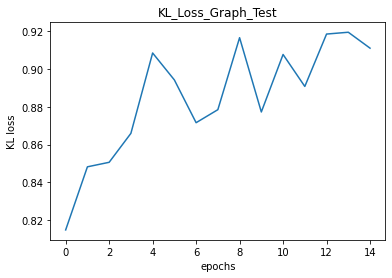

In [10]:
# *CODE FOR PART 1.2a IN THIS CELL*

def plot_line_graph(x, x_label, y, y_label, title):
  plt.plot(x, y)
  plt.title(title)
  plt.xlabel(x_label)
  plt.ylabel(y_label)
  plt.savefig('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/' + title + "_" + model_name + ".png")
  plt.show()

plot_line_graph(epochs_list, "epochs", train_eval_loss, "total loss", "Total_Loss_Graph_Train")
plot_line_graph(epochs_list, "epochs", test_eval_loss, "total loss", "Total_Loss_Graph_Test")

plot_line_graph(epochs_list, "epochs", train_eval_r_loss, "reconstruction loss", "Reconstruction_Loss_Graph_Train")
plot_line_graph(epochs_list, "epochs", test_eval_r_loss, "reconstruction loss", "Reconstruction_Loss_Graph_Test")

plot_line_graph(epochs_list, "epochs", train_eval_kl_loss, "KL loss", "KL_Loss_Graph_Train")
plot_line_graph(epochs_list, "epochs", test_eval_kl_loss, "KL loss", "KL_Loss_Graph_Test")


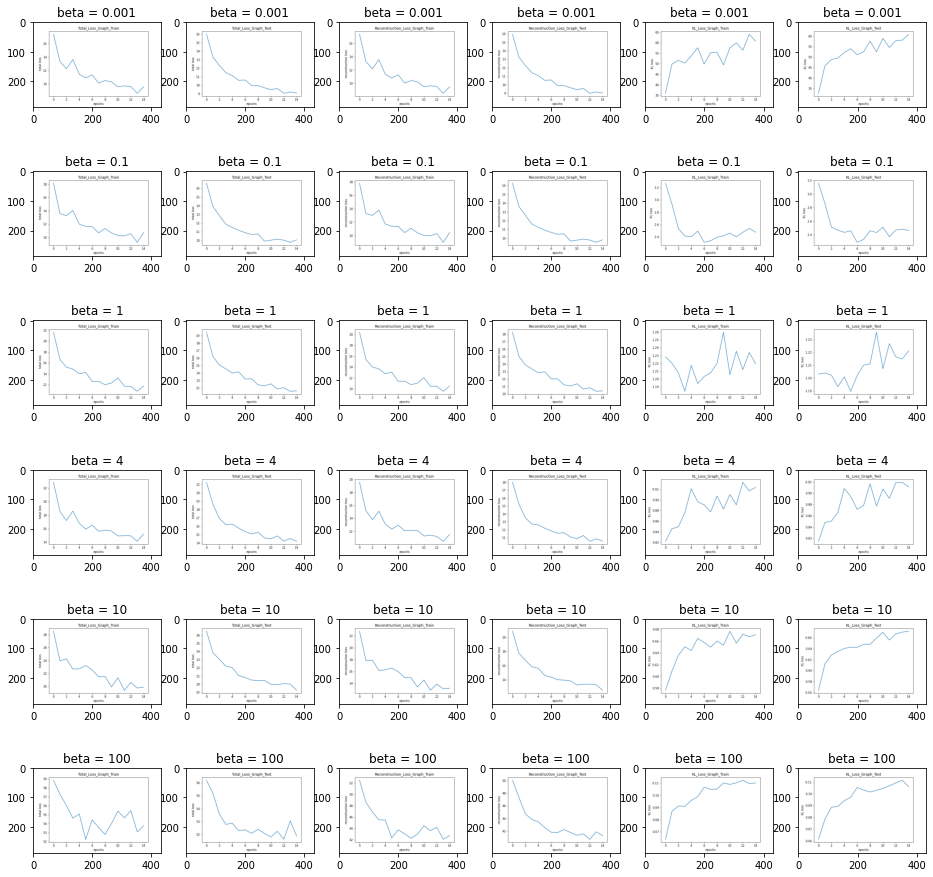

In [11]:
loss_train_0_001 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b0.001.png')
loss_test_0_001 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b0.001.png')
r_loss_train_0_001 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b0.001.png')
r_loss_test_0_001 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b0.001.png')
kl_loss_train_0_001 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b0.001.png')
kl_loss_test_0_001 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b0.001.png')

loss_train_0_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b0.1.png')
loss_test_0_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b0.1.png')
r_loss_train_0_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b0.1.png')
r_loss_test_0_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b0.1.png')
kl_loss_train_0_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b0.1.png')
kl_loss_test_0_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b0.1.png')

loss_train_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b1.png')
loss_test_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b1.png')
r_loss_train_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b1.png')
r_loss_test_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b1.png')
kl_loss_train_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b1.png')
kl_loss_test_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b1.png')

loss_train_4 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b4.png')
loss_test_4 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b4.png')
r_loss_train_4 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b4.png')
r_loss_test_4 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b4.png')
kl_loss_train_4 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b4.png')
kl_loss_test_4 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b4.png')

loss_train_10 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b10.png')
loss_test_10 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b10.png')
r_loss_train_10 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b10.png')
r_loss_test_10 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b10.png')
kl_loss_train_10 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b10.png')
kl_loss_test_10 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b10.png')

loss_train_100 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b100.png')
loss_test_100 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Total_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b100.png')
r_loss_train_100 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b100.png')
r_loss_test_100 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/Reconstruction_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b100.png')
kl_loss_train_100 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Train_VAE_epochs15_lr0.005_bs32_ld10_b100.png')
kl_loss_test_100 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/loss/KL_Loss_Graph_Test_VAE_epochs15_lr0.005_bs32_ld10_b100.png')

plt.figure(figsize = (16,16))
# New Row
ax1 = plt.subplot(6, 6, 1)
ax1.set_title("beta = 0.001")
ax1.imshow(loss_train_0_001)

ax2 = plt.subplot(6, 6, 2)
ax2.set_title("beta = 0.001")
ax2.imshow(loss_test_0_001)

ax3 = plt.subplot(6, 6, 3)
ax3.set_title("beta = 0.001")
ax3.imshow(r_loss_train_0_001)

ax4 = plt.subplot(6, 6, 4)
ax4.set_title("beta = 0.001")
ax4.imshow(r_loss_test_0_001)

ax5 = plt.subplot(6, 6, 5)
ax5.set_title("beta = 0.001")
ax5.imshow(kl_loss_train_0_001)

ax5 = plt.subplot(6, 6, 6)
ax5.set_title("beta = 0.001")
ax5.imshow(kl_loss_test_0_001)
################################
# New Row
ax1 = plt.subplot(6, 6, 7)
ax1.set_title("beta = 0.1")
ax1.imshow(loss_train_0_1)

ax2 = plt.subplot(6, 6, 8)
ax2.set_title("beta = 0.1")
ax2.imshow(loss_test_0_1)

ax3 = plt.subplot(6, 6, 9)
ax3.set_title("beta = 0.1")
ax3.imshow(r_loss_train_0_1)

ax4 = plt.subplot(6, 6, 10)
ax4.set_title("beta = 0.1")
ax4.imshow(r_loss_test_0_1)

ax5 = plt.subplot(6, 6, 11)
ax5.set_title("beta = 0.1")
ax5.imshow(kl_loss_train_0_1)

ax5 = plt.subplot(6, 6, 12)
ax5.set_title("beta = 0.1")
ax5.imshow(kl_loss_test_0_1)
################################
################################
# New Row
ax1 = plt.subplot(6, 6, 13)
ax1.set_title("beta = 1")
ax1.imshow(loss_train_1)

ax2 = plt.subplot(6, 6, 14)
ax2.set_title("beta = 1")
ax2.imshow(loss_test_1)

ax3 = plt.subplot(6, 6, 15)
ax3.set_title("beta = 1")
ax3.imshow(r_loss_train_1)

ax4 = plt.subplot(6, 6, 16)
ax4.set_title("beta = 1")
ax4.imshow(r_loss_test_1)

ax5 = plt.subplot(6, 6, 17)
ax5.set_title("beta = 1")
ax5.imshow(kl_loss_train_1)

ax5 = plt.subplot(6, 6, 18)
ax5.set_title("beta = 1")
ax5.imshow(kl_loss_test_1)
################################
################################
# New Row
ax1 = plt.subplot(6, 6, 19)
ax1.set_title("beta = 4")
ax1.imshow(loss_train_4)

ax2 = plt.subplot(6, 6, 20)
ax2.set_title("beta = 4")
ax2.imshow(loss_test_4)

ax3 = plt.subplot(6, 6, 21)
ax3.set_title("beta = 4")
ax3.imshow(r_loss_train_4)

ax4 = plt.subplot(6, 6, 22)
ax4.set_title("beta = 4")
ax4.imshow(r_loss_test_4)

ax5 = plt.subplot(6, 6, 23)
ax5.set_title("beta = 4")
ax5.imshow(kl_loss_train_4)

ax5 = plt.subplot(6, 6, 24)
ax5.set_title("beta = 4")
ax5.imshow(kl_loss_test_4)
################################
################################
# New Row
ax1 = plt.subplot(6, 6, 25)
ax1.set_title("beta = 10")
ax1.imshow(loss_train_10)

ax2 = plt.subplot(6, 6, 26)
ax2.set_title("beta = 10")
ax2.imshow(loss_test_10)

ax3 = plt.subplot(6, 6, 27)
ax3.set_title("beta = 10")
ax3.imshow(r_loss_train_10)

ax4 = plt.subplot(6, 6, 28)
ax4.set_title("beta = 10")
ax4.imshow(r_loss_test_10)

ax5 = plt.subplot(6, 6, 29)
ax5.set_title("beta = 10")
ax5.imshow(kl_loss_train_10)

ax5 = plt.subplot(6, 6, 30)
ax5.set_title("beta = 10")
ax5.imshow(kl_loss_test_10)
################################
################################
# New Row
ax1 = plt.subplot(6, 6, 31)
ax1.set_title("beta = 100")
ax1.imshow(loss_train_100)

ax2 = plt.subplot(6, 6, 32)
ax2.set_title("beta = 100")
ax2.imshow(loss_test_100)

ax3 = plt.subplot(6, 6, 33)
ax3.set_title("beta = 100")
ax3.imshow(r_loss_train_100)

ax4 = plt.subplot(6, 6, 34)
ax4.set_title("beta = 100")
ax4.imshow(r_loss_test_100)

ax5 = plt.subplot(6, 6, 35)
ax5.set_title("beta = 100")
ax5.imshow(kl_loss_train_100)

ax5 = plt.subplot(6, 6, 36)
ax5.set_title("beta = 100")
ax5.imshow(kl_loss_test_100)
################################

## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


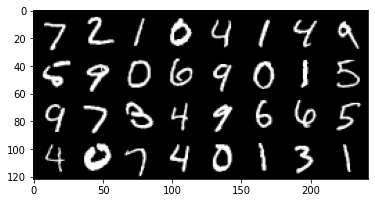

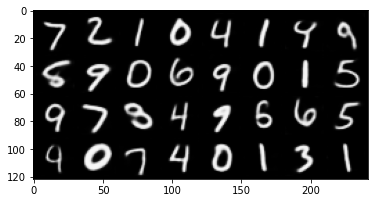

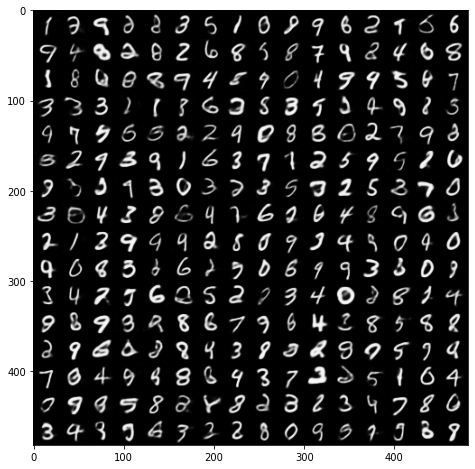

In [12]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    fixed_input = fixed_input.to(device)
    result, _, _, _ = model.forward(fixed_input)
    recon_batch = result
    #print(denorm(sample_inputs[0]))
    #print(denorm(result[0]))
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(z)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



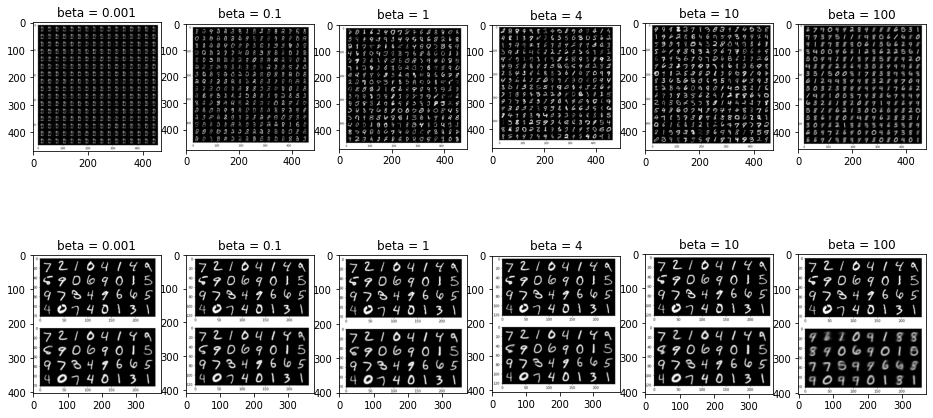

In [13]:
r_beta_0_001 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_0.001.PNG')
r_beta_0_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_0.1.PNG')
r_beta_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_1.PNG')
r_beta_4 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_4.PNG')
r_beta_10 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_10.PNG')
r_beta_100 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_100.PNG')

r2_beta_0_001 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_0.001.PNG')
r2_beta_0_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_0.1.PNG')
r2_beta_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_1.PNG')
r2_beta_4 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_4.PNG')
r2_beta_10 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_10.PNG')
r2_beta_100 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_100.PNG')

plt.figure(figsize = (16,8))

ax7 = plt.subplot(2, 6, 1)
ax7.set_title("beta = 0.001")
ax7.imshow(r_beta_0_001)

ax8 = plt.subplot(2, 6, 2)
ax8.set_title("beta = 0.1")
ax8.imshow(r_beta_0_1)

ax9 = plt.subplot(2, 6, 3)
ax9.set_title("beta = 1")
ax9.imshow(r_beta_1)

ax10 = plt.subplot(2, 6, 4)
ax10.set_title("beta = 4")
ax10.imshow(r_beta_4)

ax11 = plt.subplot(2, 6, 5)
ax11.set_title("beta = 10")
ax11.imshow(r_beta_10)

ax12 = plt.subplot(2, 6, 6)
ax12.set_title("beta = 100")
ax12.imshow(r_beta_100)

#

ax13 = plt.subplot(2, 6, 7)
ax13.set_title("beta = 0.001")
ax13.imshow(r2_beta_0_001)

ax14 = plt.subplot(2, 6, 8)
ax14.set_title("beta = 0.1")
ax14.imshow(r2_beta_0_1)

ax15 = plt.subplot(2, 6, 9)
ax15.set_title("beta = 1")
ax15.imshow(r2_beta_1)

ax16 = plt.subplot(2, 6, 10)
ax16.set_title("beta = 4")
ax16.imshow(r2_beta_4)

ax17 = plt.subplot(2, 6, 11)
ax17.set_title("beta = 10")
ax17.imshow(r2_beta_10)

ax18 = plt.subplot(2, 6, 12)
ax18.set_title("beta = 100")
ax18.imshow(r2_beta_100)


### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? Have you observed posterior collapse during traing (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**
- Looking at the constructions, as the values of beta increased they appeared to improve, with a too large beta however they began to smudge and become less sharp.
- Looking at the curves generally for various beta the general trend was an overall decrease in total loss over epochs, with the reconstruction loss decreasing and gradualy plateauing and the kl loss following a similar trend but instead increasing.
- The reconstruction loss and kl loss are at odds with eachother as one increases the other tends to decrease until the two reach an equilibrium. The reconstruction loss is initially prioritised, through the use of a correct beta value, to prevent the possibility of posterior collapse. Eventually the the kl loss grows sufficently to have a significant effect on total loss and as such ensures the probability distribution matches that of the prior.
- Posterior collapse was experianced when experimenting with different training set ups, it occured when beta value of 0.1 was used (as seen in the graphs above). For this value of priority given to the kl loss (relative to that of the reconstruction loss) the model would collapse towards the prior, which basically resulted in the decoder ignoring the sampled latent variables. In final training this was not experianced as apporpriate beta values were used to limit the effect of the kl loss - in a simple way preventing posterior collapse.

---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [14]:
# *CODE FOR PART 1.3a IN THIS CELL
from sklearn.manifold import TSNE

test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
sample_inputs, sample_labels = next(iter(test_dataloader))
model.eval()
m, l = model.encode(sample_inputs.to(device))
z_inputs = model.reparametrize(m, l)
sample_inputs = z_inputs.flatten(start_dim=1)

z_embedded = TSNE(n_components=2).fit_transform(sample_inputs.cpu().detach().numpy())

In [15]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)


alt.HConcatChart(...)

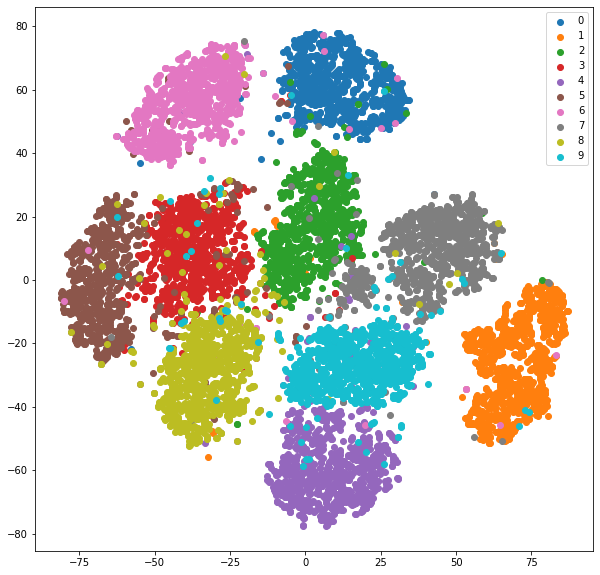

In [18]:
# Custom Visualizations
colours = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

def my_plot_tsne(z_embedded, labels, perplexity=""):
  plt.figure(figsize = (10,10))
  for i in range(10):
    idxs = np.where(labels == i)[:100]
    plots = z_embedded[idxs]
    x = plots[:,0]
    y = plots[:,1]
    plt.scatter(x, y, c=colours[i])
    
  plt.legend(range(10))
  plt.plot()
  plt.savefig('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/tsne/' + "tsne_" + model_name + perplexity + ".png")

my_plot_tsne(z_embedded, sample_labels)

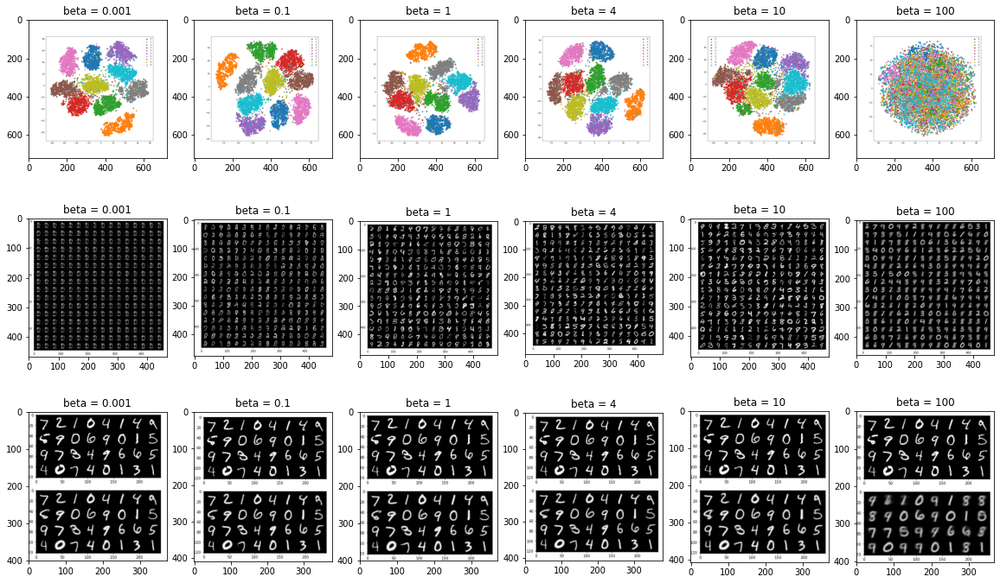

In [17]:
beta_0_001 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/tsne/tsne_VAE_epochs15_lr0.005_bs32_ld10_b0.001.png')
beta_0_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/tsne/tsne_VAE_epochs15_lr0.005_bs32_ld10_b0.1.png')
beta_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/tsne/tsne_VAE_epochs15_lr0.005_bs32_ld10_b1.png')
beta_4 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/tsne/tsne_VAE_epochs15_lr0.005_bs32_ld10_b4.png')
beta_10 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/tsne/tsne_VAE_epochs15_lr0.005_bs32_ld10_b10.png')
beta_100 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/tsne/tsne_VAE_epochs15_lr0.005_bs32_ld10_b100.png')

r_beta_0_001 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_0.001.PNG')
r_beta_0_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_0.1.PNG')
r_beta_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_1.PNG')
r_beta_4 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_4.PNG')
r_beta_10 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_10.PNG')
r_beta_100 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/b_100.PNG')

r2_beta_0_001 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_0.001.PNG')
r2_beta_0_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_0.1.PNG')
r2_beta_1 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_1.PNG')
r2_beta_4 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_4.PNG')
r2_beta_10 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_10.PNG')
r2_beta_100 = mpimg.imread('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/reconstructions/2b_100.PNG')


plt.figure(figsize = (20,12))

ax1 = plt.subplot(3, 6, 1)
ax1.set_title("beta = 0.001")
ax1.imshow(beta_0_001)

ax2 = plt.subplot(3, 6, 2)
ax2.set_title("beta = 0.1")
ax2.imshow(beta_0_1)

ax3 = plt.subplot(3, 6, 3)
ax3.set_title("beta = 1")
ax3.imshow(beta_1)

ax4 = plt.subplot(3, 6, 4)
ax4.set_title("beta = 4")
ax4.imshow(beta_4)

ax5 = plt.subplot(3, 6, 5)
ax5.set_title("beta = 10")
ax5.imshow(beta_10)

ax6 = plt.subplot(3, 6, 6)
ax6.set_title("beta = 100")
ax6.imshow(beta_100)

#

ax7 = plt.subplot(3, 6, 7)
ax7.set_title("beta = 0.001")
ax7.imshow(r_beta_0_001)

ax8 = plt.subplot(3, 6, 8)
ax8.set_title("beta = 0.1")
ax8.imshow(r_beta_0_1)

ax9 = plt.subplot(3, 6, 9)
ax9.set_title("beta = 1")
ax9.imshow(r_beta_1)

ax10 = plt.subplot(3, 6, 10)
ax10.set_title("beta = 4")
ax10.imshow(r_beta_4)

ax11 = plt.subplot(3, 6, 11)
ax11.set_title("beta = 10")
ax11.imshow(r_beta_10)

ax12 = plt.subplot(3, 6, 12)
ax12.set_title("beta = 100")
ax12.imshow(r_beta_100)

#

ax13 = plt.subplot(3, 6, 13)
ax13.set_title("beta = 0.001")
ax13.imshow(r2_beta_0_001)

ax14 = plt.subplot(3, 6, 14)
ax14.set_title("beta = 0.1")
ax14.imshow(r2_beta_0_1)

ax15 = plt.subplot(3, 6, 15)
ax15.set_title("beta = 1")
ax15.imshow(r2_beta_1)

ax16 = plt.subplot(3, 6, 16)
ax16.set_title("beta = 4")
ax16.imshow(r2_beta_4)

ax17 = plt.subplot(3, 6, 17)
ax17.set_title("beta = 10")
ax17.imshow(r2_beta_10)

ax18 = plt.subplot(3, 6, 18)
ax18.set_title("beta = 100")
ax18.imshow(r2_beta_100)




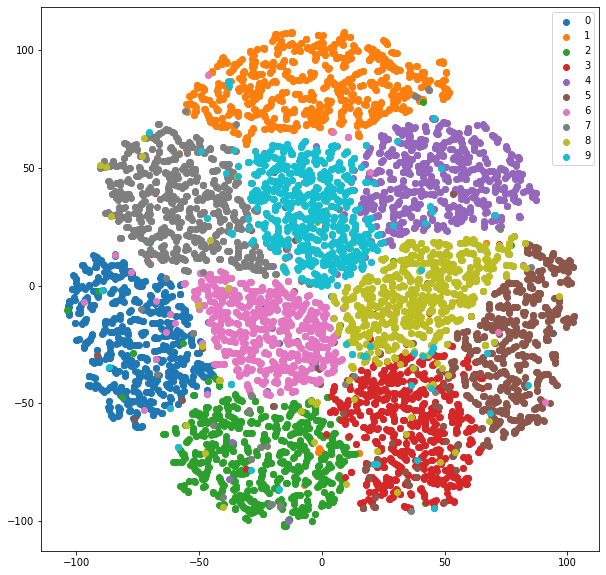

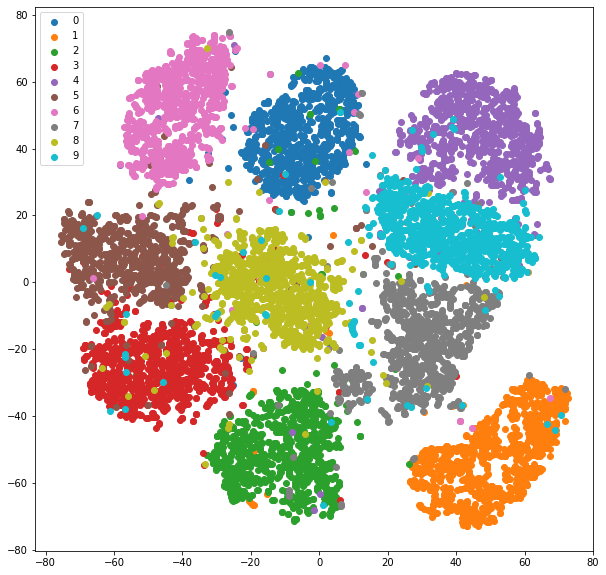

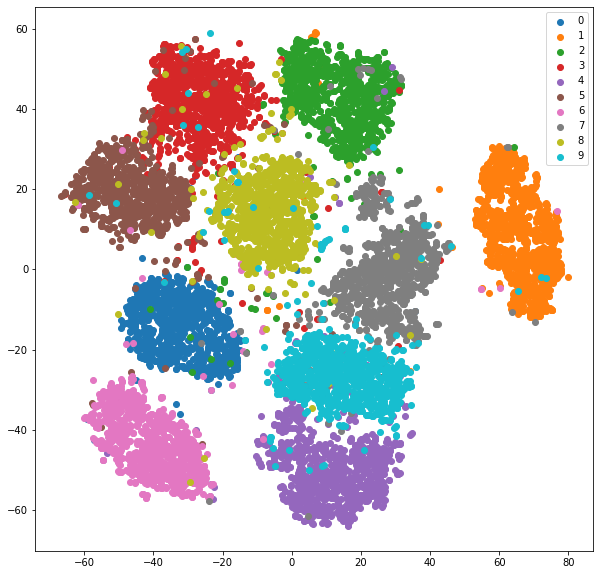

In [19]:
z_embedded = TSNE(n_components=2, perplexity=5).fit_transform(sample_inputs.cpu().detach().numpy())
my_plot_tsne(z_embedded, sample_labels, str(5))

z_embedded = TSNE(n_components=2, perplexity=30).fit_transform(sample_inputs.cpu().detach().numpy())
my_plot_tsne(z_embedded, sample_labels, str(30))

z_embedded = TSNE(n_components=2, perplexity=50).fit_transform(sample_inputs.cpu().detach().numpy())
my_plot_tsne(z_embedded, sample_labels, str(50))

### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

**YOUR ANSWER**
- As the value of Beta was increased the the entanglement of the latent space appeared to also increase, with clusters being less defined with more overlap between boundries and more outliers. Therefore it appears that as more priority is given to the kl loss the entanglement in the latent space increases.
- However for too low values of beta the reconstructions appeared to suffer.
- T-SNE is reliable to a degree, however it can often be misiterpreted. It is therefore important to vary parameters of the T-SNE as this may paint a completely different picture - If there is large change by changing parameters perhapse the T-SNE is not suitable for the task of evaluation and another method should be explored. Also it is worth bearing in mind that cluster size and relative distance have little meaning overlap of clusters however is reliable as values close in the high dimensional space will appear close in the T-SNE provided 2d space. Therefore the T-SNE is useful but one should be aware of its natural variety in outcomes, as can be seen above by changing perplexity.

## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?


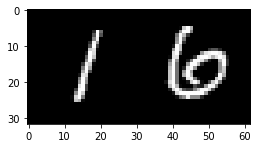

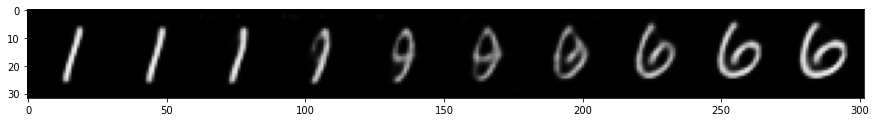

In [22]:
# CODE FOR PART 1.3b IN THIS CELL
transition_steps = 10
# pull out two samples
batch_images, batch_labels = next(iter(test_dataloader))
sample_images = batch_images[[2,11]]
sample_labels = batch_labels[[2,11]]

# illustrate them
samples = make_grid(denorm(sample_images), nrow=2, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (4,4))
show(samples)

# apply 
with torch.no_grad():
  mu, _ = model.encode(sample_images.to(device))
  mu = mu.cpu()

  values = torch.Tensor(np.linspace(mu[0], mu[1], transition_steps)).cuda()
  constructed = model.decode(values).view(transition_steps, 1, 28, 28)
  constructed = constructed.cpu()
  samples = make_grid(denorm(constructed), nrow=transition_steps, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
  plt.figure(figsize = (15,15))
  show(samples)

### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

From the above as values move from a figure 1 to a figure 6 they transition between a figure 9 and a figure 8. The transition is none the less smooth which is infact wanted by the theory of VAE's. As the values in the latent space change gradually so do the images as there is a gradual shift from one letter to the other. VAE's attempt to enfoce this through their probabilistic model, elements that appear close in the latent space should also appear close in the output decoded space which can be seen by this gradual change above.

It is challenging to relate the above to the several generated TSNE's mainly due to their variety. The above transistion makes the most sense for the TSNE generated with perplexity equal to 5. In this TSNE graph the cluster of 9 labels exists in between the clusters of labels 1 and 6 and so it would make sense that the latent space would express this relative position.

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures, tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [23]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt


def denorm(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_GAN'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small receptive fields, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [24]:
batch_size = 64 # change that

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5),),                        
])

data_dir = './datasets'

cifar10_train = datasets.CIFAR10(data_dir, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_dir, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Extracting ./datasets/cifar-10-python.tar.gz to ./datasets
Files already downloaded and verified


We'll visualize a subset of the test set: 

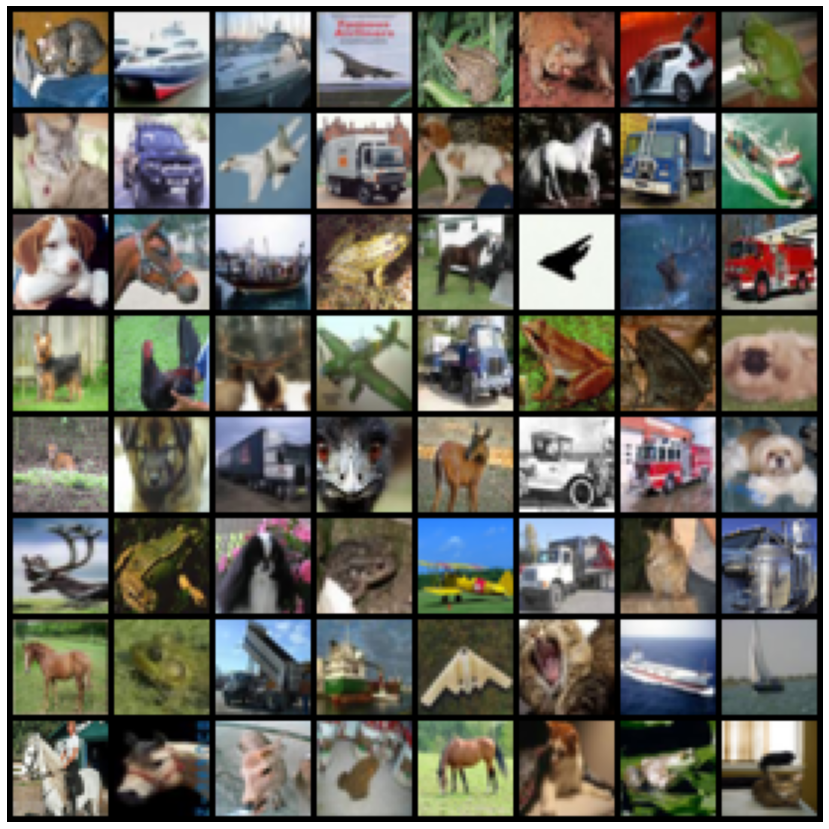

In [25]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [26]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 40 # 20
learning_rate = 0.0002 # 0.0002 # 0.00005
learning_rateD = 0.0002
learning_rateG = 0.0004
latent_vector_size = 120

# Other hyperparams
model_name = "GAN_epochs" + str(num_epochs) + "_lr" + str(learning_rate) + "_ld" + str(latent_vector_size)

In [27]:
# *CODE FOR PART 2.1 IN THIS CELL*


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.generate = nn.Sequential(
            nn.ConvTranspose2d(latent_vector_size, 512, 4, 2, 0, 0),
            nn.BatchNorm2d(512),
            #nn.ReLU(),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, 0),
            nn.BatchNorm2d(256),
            #nn.ReLU(),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(256, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            #nn.ReLU(),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(128, 3, 4, 2, 1),
            nn.Tanh()
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 


    def forward(self, z, label=None):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.generate(z)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.discriminate = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, 
                                          stride=2, padding=1), 
            nn.BatchNorm2d(32), 
            nn.LeakyReLU(),
            #nn.Dropout(0.5),
            nn.Conv2d(32, 64, kernel_size=3, 
                                          stride=2, padding=1), 
            nn.BatchNorm2d(64), 
            nn.LeakyReLU(),
            #nn.Dropout(0.5),
            nn.Conv2d(64, 128, kernel_size=3, 
                                          stride=2, padding=1), 
            nn.BatchNorm2d(128), 
            nn.LeakyReLU(),
            nn.Conv2d(128, 256, kernel_size=3, 
                                          stride=2, padding=1), 
            nn.BatchNorm2d(256), 
            nn.LeakyReLU(),
            nn.Conv2d(256, 1, kernel_size=3, 
                                          stride=2, padding=1), 
            nn.Sigmoid()
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def forward(self, x, label=None):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.discriminate(x)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        return out

## Used for WGAN implementation ##
class Critic(nn.Module):
    def __init__(self):
        super(Critic, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.discriminate = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, 
                                          stride=2, padding=1), 
            nn.InstanceNorm2d(32, affine=True), 
            nn.LeakyReLU(),
            nn.Conv2d(32, 64, kernel_size=3, 
                                          stride=2, padding=1), 
            nn.InstanceNorm2d(64, affine=True), 
            nn.LeakyReLU(),
            nn.Conv2d(64, 128, kernel_size=3, 
                                          stride=2, padding=1), 
            nn.InstanceNorm2d(128, affine=True), 
            nn.LeakyReLU(),
            nn.Conv2d(128, 256, kernel_size=3, 
                                          stride=2, padding=1), 
            nn.InstanceNorm2d(256, affine=True), 
            nn.LeakyReLU(),
            nn.Conv2d(256, 1, kernel_size=3, 
                                          stride=2, padding=1), 
            # nn.BatchNorm2d(1), 
            # nn.LeakyReLU(),
            #nn.Sigmoid()
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def forward(self, x, label):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.discriminate(x)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        return out

<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [ ]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

model_C = Critic().to(device)
if use_weights_init:
    model_C.apply(weights_init)
params_C = sum(p.numel() for p in model_C.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_C))
print(model_C)
print('\n')

Total number of parameters in Generator is: 3613315
Generator(
  (generate): Sequential(
    (0): ConvTranspose2d(120, 512, kernel_size=(4, 4), stride=(2, 2))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 391681
Discriminator(
  (discriminate): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [ ]:
BCE_loss = nn.BCELoss()
MSE_loss = nn.MSELoss()

def loss_function(out, label, mse=False):
    if mse:
      return MSE_loss(out, label)
    loss = BCE_loss(out, label)
    return loss

<h3>Choose and initialize optimizers</h3>

In [ ]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))
sD = torch.optim.lr_scheduler.StepLR(optimizerD, step_size=10, gamma=0.985)
sG = torch.optim.lr_scheduler.StepLR(optimizerG, step_size=10, gamma=0.990)


<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [ ]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
fixed_noise_label = torch.randint(0, 10, (batch_size, 1, 1, 1), dtype=torch.float).to(device)

real_label = 0.9 #1
real_label_low = 0.85
real_label_high = 1.0
fake_label = 0.1 #0
fake_label_low = 0
fake_label_high = 0.15

#### Training Loop

In [ ]:
# #######################################################################
# # Attempt at WGAN, DCGAN below!                                       #
# #######################################################################

# optimizerC = torch.optim.RMSprop(model_C.parameters(), lr=learning_rate)
# optimizerG = torch.optim.RMSprop(model_G.parameters(), lr=learning_rate)

# train_losses_G = []
# train_losses_C = []

# for epoch in range(num_epochs):
#     for i, data in enumerate(loader_train, 0):
#         train_loss_C = 0
#         train_loss_G = 0
        
#         ############################
#         # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
#         ###########################device
#         # train with real
#         real_data = data[0].to(device)
#         real_labels = data[1].to(device)
#         current_batch_size = real_data.size(0)
#         #input("Press Enter to continue...")
        
#         for _ in range(5):
#           z = torch.randn(current_batch_size, latent_vector_size, 1, 1).to(device)
#           z_label = torch.randint(0, 10, (current_batch_size, 1, 1, 1), dtype=torch.float).to(device)
#           fake_out = model_G.forward(z, z_label)

#           out_real = model_C(real_data, real_labels.float()).view(-1)
#           out_fake = model_C(fake_out.detach(), z_label).view(-1)

#           loss = -(torch.mean(out_real) - torch.mean(out_fake))
#           model_C.zero_grad()
#           loss.backward(retain_graph=True)
#           optimizerC.step()
#           for p in model_C.parameters():
#                 p.data.clamp_(-0.01, 0.01)
          
#           errC = loss
#           train_loss_C += errC.item()

#         ############################
#         # (2) Update G network: maximize log(D(G(z)))
#         ###########################
#         out_gen_fake = model_C.forward(fake_out, z_label).view(-1)
#         errG = -torch.mean(out_gen_fake)
#         model_G.zero_grad()
#         errG.backward()
#         optimizerG.step()
#         train_loss_G += errG.item()
        

#         print('[%d/%d][%d/%d] Loss_D: %.6f Loss_G: %.6f'
#               % (epoch, num_epochs, i, len(loader_train),
#                  errC.item(), errG.item()))

#     if epoch == 0:
#         save_image(denorm(real_data.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/real_samples.png')
#     with torch.no_grad():
#         fake = model_G(fixed_noise, fixed_noise_label)
#         save_image(denorm(fake.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/fake_samples_epoch_%03d.png' % epoch)
#     train_losses_C.append(train_loss_C / len(loader_train))
#     train_losses_G.append(train_loss_G / len(loader_train))
   
# model_C.eval()
# model_G.eval()

# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
# torch.jit.save(torch.jit.trace(model_G, (fixed_noise, fixed_noise_label)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/WGAN_G_model.pth')
# torch.jit.save(torch.jit.trace(model_C, (fake, fixed_noise_label)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/WGAN_C_model.pth')

In [ ]:
#######################################################################
# Attempt at DCGAN                                                    #
#######################################################################

train_losses_G = []
train_losses_D = []

for epoch in range(num_epochs):
    for i, data in enumerate(loader_train, 0):
        train_loss_D = 0
        train_loss_G = 0
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################device
        # train with real
        model_D.zero_grad()
        real_data = data[0].to(device)
        real_labels = data[1].to(device)
        current_batch_size = real_data.size(0)
        
        out_value = model_D(real_data, real_labels.float()).view(-1)
        label = torch.full((current_batch_size,), real_label, dtype=torch.float).to(device)

        if np.random.rand() > 0.05:
          label.fill_(real_label)
        else:
          label.fill_(fake_label)
        loss_real = loss_function(out_value, label)
        
        loss_real.backward()
        D_x = out_value.mean().item()

        # train with fake
        z = torch.randn(current_batch_size, latent_vector_size, 1, 1).to(device)
        z_label = torch.randint(0, 10, (current_batch_size, 1, 1, 1), dtype=torch.float).to(device)
        fake_out = model_G.forward(z, z_label)
        label.fill_(fake_label)
        out_value = model_D.forward(fake_out.detach(), z_label).view(-1)
        
        if np.random.rand() > 0.05:
          label.fill_(fake_label)
        else:
          label.fill_(real_label)
        loss_fake = loss_function(out_value, label)
        
        loss_fake.backward()
        D_G_z1 = out_value.mean().item()

        errD = (loss_real + loss_fake) #/2
        train_loss_D += errD
        optimizerD.step()


        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        model_G.zero_grad()
        label.fill_(real_label)
        out = model_D.forward(fake_out, z_label).view(-1)
        errG = loss_function(out, label)
        errG.backward()
        D_G_z2 = out.mean().item()
        train_loss_G += errG
        optimizerG.step()


        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        model_G.zero_grad()
        label.fill_(real_label)
        out = model_D.forward(fake_out, z_label).view(-1)
        errG = loss_function(out, label)
        errG.backward()
        D_G_z2 = out.mean().item()
        train_loss_G += errG
        optimizerG.step()
        

        print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(loader_train),
                 errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    if epoch == 0:
        save_image(denorm(real_data.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise, fixed_noise_label)
        save_image(denorm(fake.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/fake_samples_epoch_%03d.png' % epoch)
    train_losses_D.append(train_loss_D.item() / len(loader_train))
    train_losses_G.append(train_loss_G.item() / len(loader_train))
   
    
    sD.step()
    sG.step()
   

model_G.eval()
model_D.eval()
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise, fixed_noise_label)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake, fixed_noise_label)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_D_model.pth')



torch.Size([64, 512, 3, 3])


RuntimeError: ignored

## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

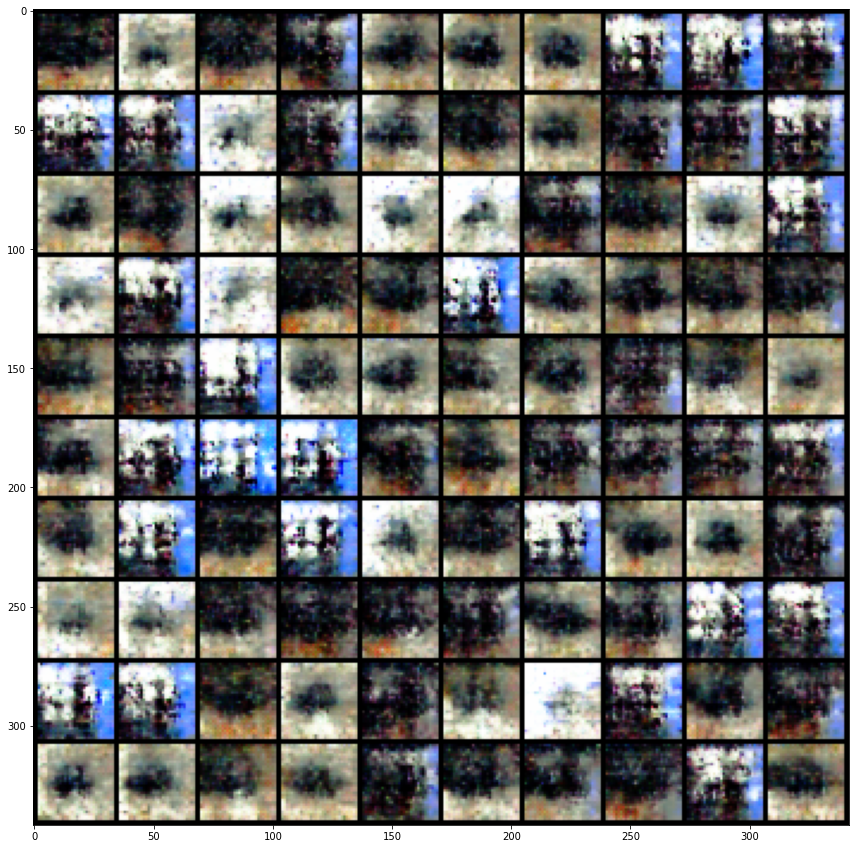

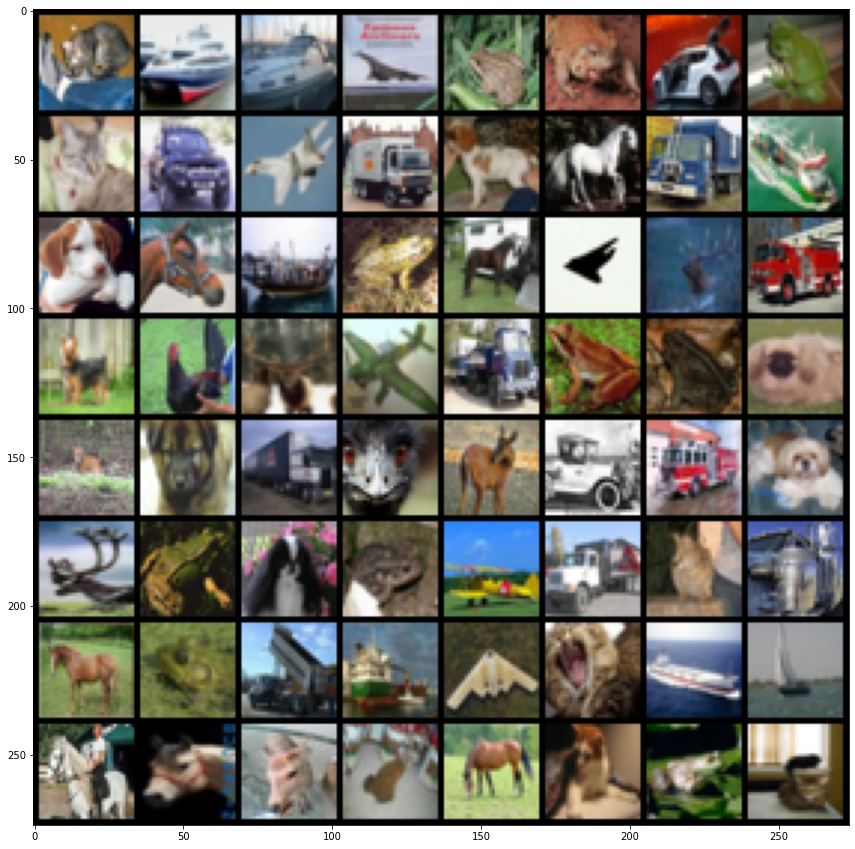

In [ ]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
noise_label = torch.zeros((100, 1, 1, 1), dtype=torch.float).to(device)
noise_label[10:20] = 1
noise_label[20:30] = 2
noise_label[30:40] = 3
noise_label[40:50] = 4
noise_label[50:60] = 5
noise_label[60:70] = 6
noise_label[70:80] = 7
noise_label[80:90] = 8
noise_label[90:100] = 9
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise, noise_label).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated,'/content/drive/MyDrive/icl_dl_cw2/CW_GAN/Teaching30final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

I began with a simplistic MLP based generator and discriminator, which did not have prommising results. Expanding further I removed all the linear layers and replaced them with convolutions for downsampling layers and transpose convolutions for upsampling layers, making sure the final dimensions worked. For activation functions of each layer I initially decided to use Relu. Finally I used a Sigmoid activativation for the Discriminator and Generator final layer. At this point the model was still not learning: 

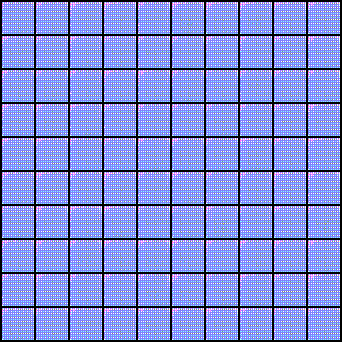

<!-- Following from the literature I set about replacing the final activation function of the Generator with a tanh activation. **Insert V2**

Then I added batchnorms to each layer, the improvement was minimal however even in the 20 epochs it could be argued that the images formed resembled objects rather than colourful landscapes. **Insert V3**

Next replacing the ReLU with LeakyReLU in both the generator and discriminator  produced marginal improvements still. 
**Insert V4** 

Adding a Dropout of 50% to every block in the generator and descriminator appeared to drastically reduce rate of learning. Reducing the percentage of drop out improved on this. **Insert V5**

Following from the general literature I set about adding noise to the Discriminator loss. After some experimentation it was clear that with a probability of 0.05 would be best for flipping the value for fake and real labels, any higher and learning would be affected. I attempted to also add soft labels to introduce some regularization to learning, initially setting the real label to 0.9 and the fake label to 0.1. This appeared to minimaly slow down learning but improve diversity of results. I further attempted to add random label smoothing by assigning the labels within a range eg. for real labels between 0.85 and 1.0 - this did not seem to bring me any improvement. **Insert V6**

I also experimented with varying the initial learning rates of the Generator and Discriminator. It appeared that by increasing the learning rate of the Generator compared to the Disciminator improved results marginally. Also by adding a scheduler the learning rate could be decreased over iterations in the hope of improving the stability of learning. This did not negatively affect learning outcome.  **Insert V7**

I further attempted to add labels as inputs to the Generator and Discriminator implementing a conditional GAN. This reduced learning success within the 30 epochs while also introducing serious mode collapse. 
Following from the literature I tried to deal with the mode collapse using a WGAN implementation, sadly to no success. **Insert V8**

By this point I had spent a long time experimenting and decided to go with my simpler more successful model, however running it for more iterations.  **Insert V9** -->

Following from the literature I set about replacing the final activation function of the Generator with a tanh activation.
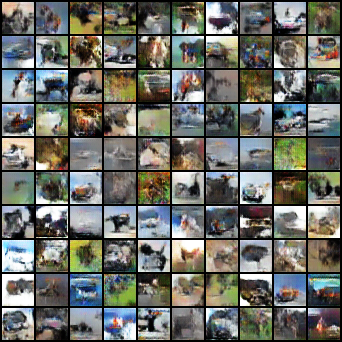

Then I added batchnorms to each layer, the improvement was minimal however even in the 20 epochs it could be argued that the images formed resembled objects rather than colourful landscapes.

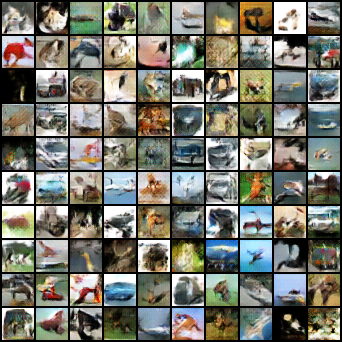

Next replacing the ReLU with LeakyReLU in both the generator and discriminator produced marginal improvements still. 

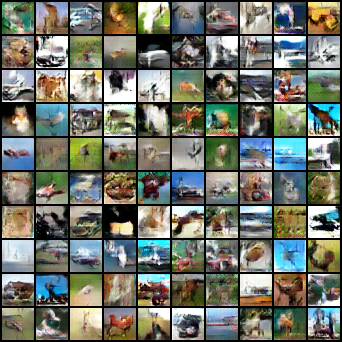

Adding a Dropout of 50% to every block in the generator and descriminator appeared to drastically reduce rate of learning. Reducing the percentage of drop out improved on this. 

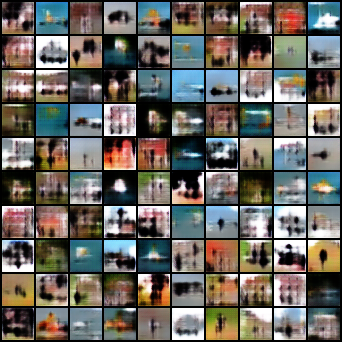

Following from the general literature I set about adding noise to the Discriminator loss. After some experimentation it was clear that with a probability of 0.05 would be best for flipping the value for fake and real labels, any higher and learning would be affected. I attempted to also add soft labels to introduce some regularization to learning, initially setting the real label to 0.9 and the fake label to 0.1. This appeared to minimaly slow down learning but improve diversity of results. I further attempted to add random label smoothing by assigning the labels within a range eg. for real labels between 0.85 and 1.0 - this did not seem to bring me any improvement.

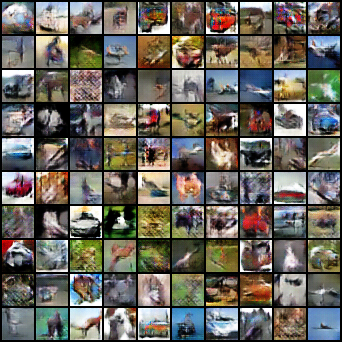

I also experimented with varying the initial learning rates of the Generator and Discriminator. It appeared that by increasing the learning rate of the Generator compared to the Disciminator improved results marginally. Also by adding a scheduler the learning rate could be decreased over iterations in the hope of improving the stability of learning. This did not negatively affect learning outcome. 

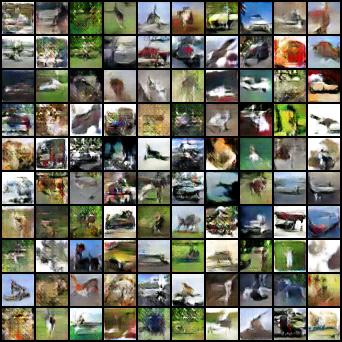

I further attempted to add labels as inputs to the Generator and Discriminator implementing a conditional GAN. This reduced learning success within the 30 epochs while also introducing serious mode collapse. Following from the literature I tried to deal with the mode collapse using a WGAN implementation, sadly to no success. 

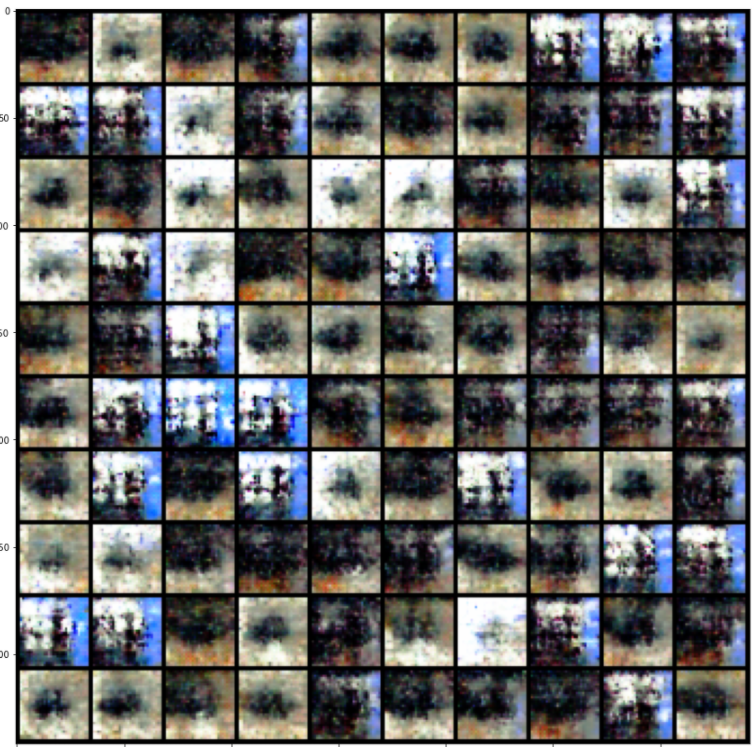

By this point I had spent a long time experimenting and decided to go with my simpler more successful model, however running it for more iterations.

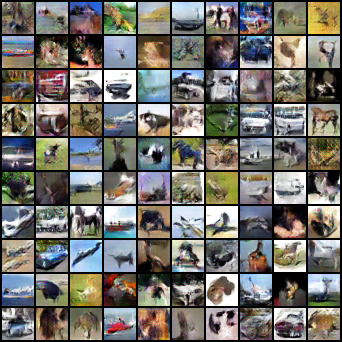

## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

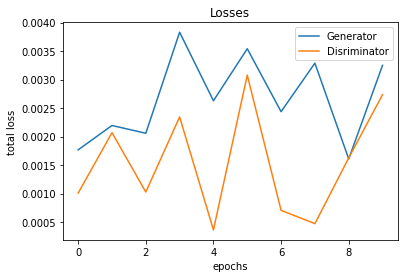

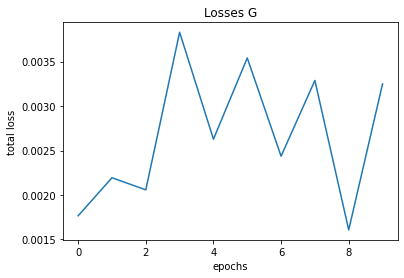

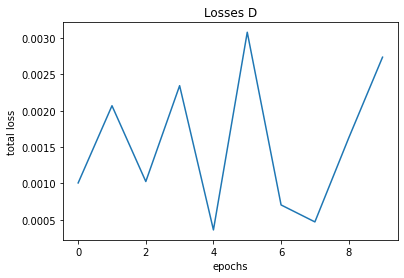

<Figure size 432x288 with 0 Axes>

In [ ]:
# ANSWER FOR PART 2.2 IN THIS CELL*
def plot_line_graph(x, x_label, yG, yD, y_label, title):
  plt.plot(x, yG, label='Generator')
  plt.plot(x, yD, label="Disriminator")
  plt.title(title)
  plt.xlabel(x_label)
  plt.ylabel(y_label)
  plt.legend()
  plt.show()
  plt.savefig('/content/drive/MyDrive/icl_dl_cw2/CW_GAN/' + title + "_" + model_name + ".png")

def plot_line_graph_basic(x, x_label, y, y_label, title):
  plt.plot(x, y)
  plt.title(title)
  plt.xlabel(x_label)
  plt.ylabel(y_label)
  plt.show()
  plt.savefig('/content/drive/MyDrive/icl_dl_cw2/CW_GAN/' + title + "_" + model_name + ".png")

plot_line_graph(range(num_epochs), "epochs", train_losses_G, train_losses_D, "total loss", "Losses")

plot_line_graph_basic(range(num_epochs), "epochs", train_losses_G, "total loss", "Losses G")
plot_line_graph_basic(range(num_epochs), "epochs", train_losses_D, "total loss", "Losses D")

# plot_line_graph(range(num_epochs), "epochs", train_losses_G, train_losses_C, "total loss", "Losses")

# plot_line_graph_basic(range(num_epochs), "epochs", train_losses_G, "total loss", "Losses G")
# plot_line_graph_basic(range(num_epochs), "epochs", train_losses_C, "total loss", "Losses C")


### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

The expectation for the GAN losses are that they will initially vary a lot eventually settling down as the two losses reach an equilibrium point. During training the two losses "compete" against eachother, this can often result in quite sparatic behaviour, as one begins to improve the othere will begin to fail and visa-versa until they both settle down.

Therefore looking to my loss curves they look sensible, they have minor oscillations as they compete against eachother. Towards the end the loss appears suffer a large jump as the descriminator begins to improve rapidly and the generator loss increases greatly over this period, it could be argued that this is infact an early sign of mode collapse. 

## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:** 

Based on the images created by your generator using the `fixed_noise` vector during training, provide a discussion on whether you noticed any mode collapse, what this behaviour may be attributed to, and explain what you did in order to cope with mode collapse.

In [ ]:
# Any additional code

### Discussion


**YOUR ANSWER**

Mode collapse tends to occur when the generator manages to produce an output that can fool the discriminator and as a result the generator learns to only produce that output. By producing the same output over and over the discriminator then learns to just reject this output. However if the discriminator cannot find this strategy then it is too simple for the generator to produce a plausible output. Basically for each iteration the generator learns to overoptimise for a particular discriminator and the discriminator is stuck not learning.

I mainly experianced mode collapse when I introduced class labels into the models (Conditional GAN). For the resulting images produced there was a common theme of images and patterns being repeated - basically a reduction in image diversity. Looking to the loss function produced as a result there appeared to be oscillations especially when looking at the generator loss, as the generator would overoptimise for each particular disriminator so foe each new discriminator the loss would increase and then rapidly decrease.

In an attempt to deal with mode collapse I implemented WGAN to no real success for accurate image generation. Therefore I returned back to my simple model formulation not including labels which managed to avoid mode collapse in its learning. 



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="blue"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [ ]:
# If you want to run these tests yourself, change directory:
# !cd /content/drive/MyDrive/icl_dl_cw2/

In [ ]:
!pip install -q torch torchvision

In [ ]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [ ]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

def gan_denorm(x):
    return x

gan_latent_size = 

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [ ]:
# Load VAE Dataset
test_dat = datasets.MNIST("./data/", train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [ ]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

In [ ]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
vae = model_G = torch.jit.load('./CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional

for module in vae.children():
    for layer in module.children():
        if "Conv2d" in layer.original_name:
            print("Used Convs")
            break

vae_in = make_grid(denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

In [ ]:
# GAN Tests
model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)